In [24]:
pip install pyseagull

Note: you may need to restart the kernel to use updated packages.


In [25]:
import seagull as sg
import seagull.lifeforms as lf
# Some settings to show a JS animation
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"

In [26]:
# Initialize board
board = sg.Board(size=(40,40))

# Add three Pulsar lifeforms in various locations
board.add(lf.Pulsar(), loc=(1,1))
board.add(lf.Pulsar(), loc=(1,22))
board.add(lf.Pulsar(), loc=(20,1))
board.add(lf.Pulsar(), loc=(20,22))

2025-05-02 15:17:23.482 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


{'peak_cell_coverage': 0.18,
 'avg_cell_coverage': 0.1463366336633663,
 'avg_shannon_entropy': 3.0217796046186556,
 'peak_shannon_entropy': 3.2433182601909962}

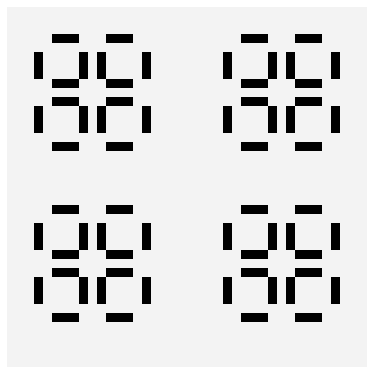

In [27]:
board.view()

sim = sg.Simulator(board)
sim.run(sg.rules.conway_classic, iters=100)

2025-05-02 15:17:23.539 | INFO     | seagull.simulator:animate:183 - Rendering animation...


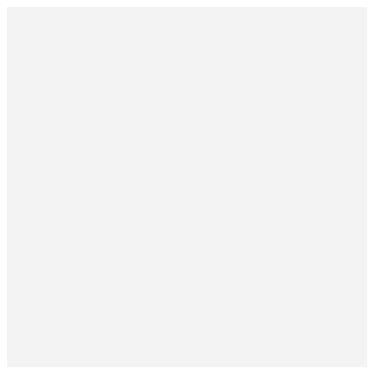

In [28]:
anim = sim.animate()

In [30]:
anim

In [32]:
# This is how you make a custom lifeform
custom_lf = lf.Custom([[0, 0, 1, 1, 0],
                       [1, 1, 0, 1, 1],
                       [1, 1, 1, 1, 0],
                       [0, 1, 1, 0, 0]])

2025-05-02 15:23:38.775 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2025-05-02 15:23:39.001 | INFO     | seagull.simulator:animate:183 - Rendering animation...


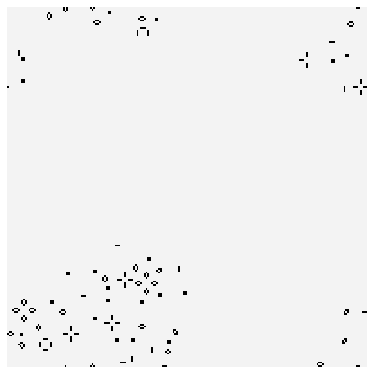

In [44]:
# Define the Gosper Glider Gun pattern
gosper_glider_gun_pattern = [
    [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1],
    [0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1],
    [1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
    [1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
]

# Create the custom lifeform
gosper_gun = lf.Custom(gosper_glider_gun_pattern)

# Initialize a new board large enough for the gun and gliders
# Using a size of (50, 100) as an example
board_gun = sg.Board(size=(200, 200))

# Add the Gosper Glider Gun to the board
board_gun.add(gosper_gun, loc=(1, 1))

# Create a simulator for the new board
sim_gun = sg.Simulator(board_gun)

# Run the simulation using Conway's classic rules for 100 iterations
sim_gun.run(sg.rules.conway_classic, iters=5000)

# Generate the animation
anim_gun = sim_gun.animate()

# Display the animation (this will work in Jupyter)
anim_gun

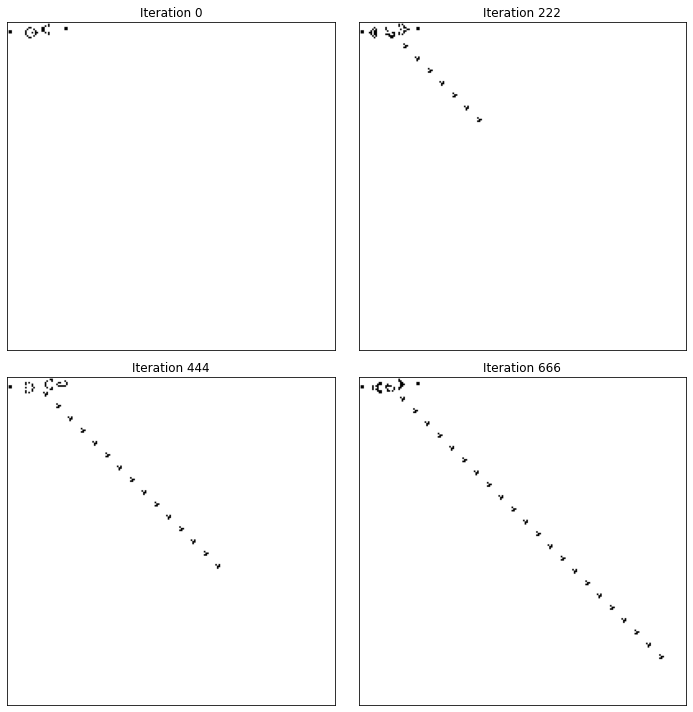

In [47]:
# Get the history of the simulation states
history = sim_gun.get_history()

# Select the frames at the specified iterations
iterations_to_plot = [0, 222, 444, 666]
frames_to_plot = [history[i] for i in iterations_to_plot]

# Create a 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten() # Flatten the 2x2 array for easy iteration

# Plot each selected frame
for i, frame_index in enumerate(iterations_to_plot):
    ax = axes[i]
    # Ensure the frame data is suitable for imshow (e.g., numpy array)
    # The history likely contains the board state directly
    ax.imshow(history[frame_index], cmap='binary')
    ax.set_title(f"Iteration {frame_index}")
    ax.set_xticks([])
    ax.set_yticks([])

# Adjust layout to prevent titles overlapping
plt.tight_layout()
plt.show()

In [ ]:
import os

# Define the directory to save figures
figures_dir = '.../figures'
# Create the directory if it doesn't exist
os.makedirs(figures_dir, exist_ok=True)

# Define the file path for the figure
file_path = os.path.join(figures_dir, 'gosper_gun_iterations.png')

# Save the figure
fig.savefig(file_path)

print(f"Figure saved to {file_path}")

Figure saved to /Users/adamg/Downloads/classes/CSCI3384/finalProject/csci3384_conway/figures/gosper_gun_iterations.png


2025-05-02 16:40:17.097 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seagull/utils/statistics.py:23: RuntimeWarning: divide by zero encountered in log2
  return -np.sum(np.log2([zero_probs, one_probs]))
2025-05-02 16:40:17.103 | INFO     | seagull.simulator:animate:183 - Rendering animation...


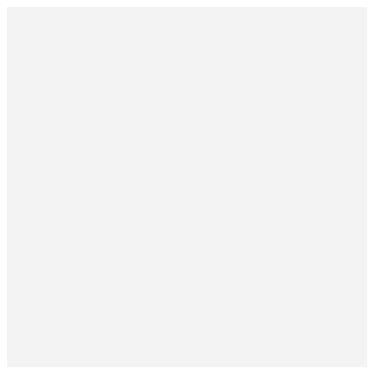

In [55]:
import numpy as np

# Define the Eater 1 pattern
eater_pattern = lf.Custom([[0, 1, 0, 0],
                           [1, 0, 1, 0],
                           [0, 1, 0, 1],
                           [0, 0, 1, 1]])

# Define the Glider pattern (already available in lf.Glider)
glider = lf.Glider()

# Initialize a new board
# Size needs to be large enough for interaction
board_eater_interaction = sg.Board(size=(40, 40))

# Add the Eater to the board
# Position it so the glider can approach it
eater_loc = (20, 20)
board_eater_interaction.add(eater_pattern, loc=eater_loc)

# Add the Glider to the board
# Position it top-left relative to the eater so it flies into it
glider_loc = (5, 5)
board_eater_interaction.add(glider, loc=glider_loc)

# Create a simulator for the new board
sim_eater = sg.Simulator(board_eater_interaction)

# Run the simulation for enough iterations to see the interaction
# Need enough steps for glider to reach and interact with the eater
num_iterations_eater = 80
sim_eater.run(sg.rules.conway_classic, iters=num_iterations_eater)

# Generate the animation
anim_eater = sim_eater.animate(interval=200) # Slower interval for clarity

# Display the animation
anim_eater

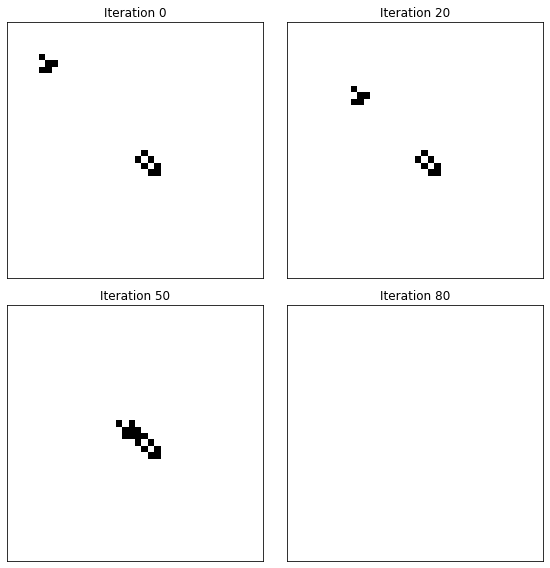

Eater interaction figure saved to /Users/adamg/Downloads/classes/CSCI3384/finalProject/csci3384_conway/figures/eater_interaction_iterations.png


In [60]:
# Get the history of the eater simulation states
history_eater = sim_eater.get_history()

# Select the frames at specified iterations (ensure they are within num_iterations_eater)
iterations_eater_to_plot = [0, 20, 50, 80] # Example iterations
frames_eater_to_plot = [history_eater[i] for i in iterations_eater_to_plot]

# Create a 2x2 subplot grid
fig_eater, axes_eater = plt.subplots(2, 2, figsize=(8, 8))
axes_eater = axes_eater.flatten() # Flatten the 2x2 array for easy iteration

# Plot each selected frame
for i, frame_index in enumerate(iterations_eater_to_plot):
    ax = axes_eater[i]
    # Ensure the frame data is suitable for imshow
    ax.imshow(history_eater[frame_index], cmap='binary')
    ax.set_title(f"Iteration {frame_index}")
    ax.set_xticks([])
    ax.set_yticks([])

# Adjust layout to prevent titles overlapping
plt.tight_layout()
plt.show()

# Optionally, save this figure as well
eater_figure_path = os.path.join(figures_dir, 'eater_interaction_iterations.png')
fig_eater.savefig(eater_figure_path)
print(f"Eater interaction figure saved to {eater_figure_path}")

2025-05-02 16:49:48.213 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seagull/utils/statistics.py:23: RuntimeWarning: divide by zero encountered in log2
  return -np.sum(np.log2([zero_probs, one_probs]))
2025-05-02 16:49:48.217 | INFO     | seagull.simulator:animate:183 - Rendering animation...


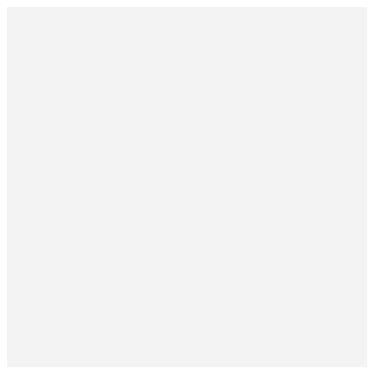

In [66]:
# Define the Block pattern (a simple still life that can reflect gliders)
block_pattern = lf.Custom([[1, 1],
                           [1, 1]])

# Glider is already defined from a previous cell
# glider = lf.Glider() # No need to redefine if 'glider' exists

# Initialize a new board for the block interaction
board_block = sg.Board(size=(40, 40))

# Add the Block to the board
block_loc = (20, 20)
board_block.add(block_pattern, loc=block_loc)

# Add a Glider aimed at the block
# Position it top-left relative to the block for a potential 90-degree reflection
# Fine-tuning this location might be needed for the desired reflection
glider_block_loc = (15, 15)
board_block.add(glider, loc=glider_block_loc)

# Create a simulator for this board
sim_block = sg.Simulator(board_block)

# Run the simulation for enough iterations to see the interaction
num_iterations_block = 60 # Adjust as needed based on interaction speed
sim_block.run(sg.rules.conway_classic, iters=num_iterations_block)

# Generate the animation
anim_block = sim_block.animate(interval=150) # Adjust interval for viewing speed

# Display the animation
anim_block


Memory cell figure saved to /Users/adamg/Downloads/classes/CSCI3384/finalProject/csci3384_conway/figures/memory_cell_conceptual.png


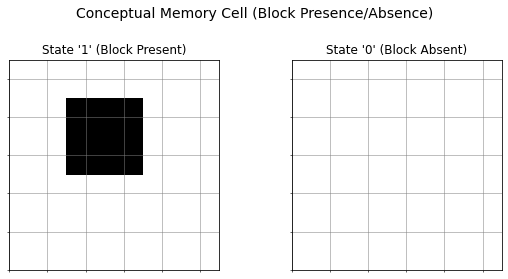

In [67]:
import numpy as np
import os

import matplotlib.pyplot as plt

# Ensure the figures directory exists (defined in CELL INDEX 9)
# figures_dir = '.../figures' # This variable should exist from cell 9
# os.makedirs(figures_dir, exist_ok=True) # Already done in cell 9, but safe to repeat

# Create the figure and subplots for the memory cell concept
fig_memory, axes_memory = plt.subplots(1, 2, figsize=(8, 4))

# Define a small grid size for visualization
grid_size_mem = 5

# --- State '1' (Block Present) ---
state1_grid = np.zeros((grid_size_mem, grid_size_mem), dtype=int)
# Center the 2x2 block pattern
center_mem = grid_size_mem // 2
state1_grid[center_mem-1:center_mem+1, center_mem-1:center_mem+1] = 1 # 2x2 block

axes_memory[0].imshow(state1_grid, cmap='binary', origin='upper', extent=[0, grid_size_mem, 0, grid_size_mem])
axes_memory[0].set_title("State '1' (Block Present)")
axes_memory[0].set_xticks(np.arange(-.5, grid_size_mem, 1), minor=True)
axes_memory[0].set_yticks(np.arange(-.5, grid_size_mem, 1), minor=True)
axes_memory[0].grid(which='minor', color='grey', linestyle='-', linewidth=0.5)
axes_memory[0].tick_params(which='major', bottom=False, left=False, labelbottom=False, labelleft=False)


# --- State '0' (Block Absent) ---
state0_grid = np.zeros((grid_size_mem, grid_size_mem), dtype=int)

axes_memory[1].imshow(state0_grid, cmap='binary', origin='upper', extent=[0, grid_size_mem, 0, grid_size_mem])
axes_memory[1].set_title("State '0' (Block Absent)")
axes_memory[1].set_xticks(np.arange(-.5, grid_size_mem, 1), minor=True)
axes_memory[1].set_yticks(np.arange(-.5, grid_size_mem, 1), minor=True)
axes_memory[1].grid(which='minor', color='grey', linestyle='-', linewidth=0.5)
axes_memory[1].tick_params(which='major', bottom=False, left=False, labelbottom=False, labelleft=False)


# Add a main title
fig_memory.suptitle("Conceptual Memory Cell (Block Presence/Absence)", fontsize=14)

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect to make space for suptitle

# Save the figure
memory_figure_path = os.path.join(figures_dir, 'memory_cell_conceptual.png')
fig_memory.savefig(memory_figure_path)
print(f"Memory cell figure saved to {memory_figure_path}")

# Display the plot
plt.show()